[![Binder](https://mybinder.org/badge_logo.svg)](https://nbviewer.org/github/Sistemas-Multimedia/Sistemas-Multimedia.github.io/blob/master/milestones/06-YUV_compression/color-DCT_compression.ipynb)

[![Colab](https://badgen.net/badge/Launch/on%20Google%20Colab/blue?icon=notebook)](https://colab.research.google.com/github/Sistemas-Multimedia/Sistemas-Multimedia.github.io/blob/master/contents/color_DCT/RD_performance.ipynb)

# Color-DCT lossless compression performance

Removing redundancy in the color domain with the [DCT](https://docs.scipy.org/doc/scipy/reference/generated/scipy.fftpack.dct.html). We measure the information reduction in terms of the entropy.

In [ ]:
%%bash
if [ -d "$HOME/repos" ]; then
    echo "\"$HOME/repos\" exists"
else
    mkdir ~/repos
    echo Created $HOME/repos
fi

In [ ]:
%%bash
if [ -d "$HOME/repos/scalar_quantization" ]; then
    cd $HOME/repos/scalar_quantization
    echo "$HOME/repos/scalar_quantization ... "
    git pull 
else
    cd $HOME/repos
    git clone https://github.com/vicente-gonzalez-ruiz/scalar_quantization.git
fi

In [ ]:
%%bash
if [ -d "$HOME/repos/image_IO" ]; then
    cd $HOME/repos/image_IO
    echo "$HOME/repos/image_IO ... "
    git pull 
else
    cd $HOME/repos
    git clone https://github.com/vicente-gonzalez-ruiz/image_IO.git
fi

In [ ]:
%%bash
if [ -d "$HOME/repos/MRVC" ]; then
    cd $HOME/repos/MRVC
    echo "$HOME/repos/MRVC ... "
    git pull 
else
    cd $HOME/repos
    git clone https://github.com/Sistemas-Multimedia/MRVC.git
fi

In [ ]:
!ln -sf ~/repos/scalar_quantization/information.py .
!ln -sf ~/repos/scalar_quantization/distortion.py .
!ln -sf ~/repos/scalar_quantization/quantization.py .
!ln -sf ~/repos/scalar_quantization/deadzone_quantization.py .
!ln -sf ~/repos/image_IO/image_1.py .
!ln -sf ~/repos/image_IO/image_3.py .
!ln -sf ~/repos/image_IO/logging_config.py .
!ln -sf ~/repos/color_DCT/color_DCT.py .

In [1]:
%matplotlib inline

#import matplotlib
#import matplotlib.pyplot as plt
#import matplotlib.axes as ax
#plt.rcParams['text.usetex'] = True
#plt.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command

try:
    import matplotlib.pyplot as plt
except:
    !pip install matplotlib
    import matplotlib.pyplot as plt
%matplotlib inline

import pylab
import math
import numpy as np

try:
    from scipy import signal
except:
    !pip install scipy
    from scipy import signal
    
try:
    import cv2
except:
    !pip install opencv-python
    !pip install opencv-python-headless # Binder compatibility

import os
import quantization
import deadzone_quantization as deadzone
#import midtread_quantizer as midtread
#import midrise_quantizer as midrise
import color_DCT
import distortion
import information
import image_3 as RGB_image
import image_1 as gray_image
import colored
#import common

## Configuration

In [30]:
# Prefix of the RGB image to be compressed.

home = os.environ["HOME"]
fn = home + "/repos/MRVC/images/lena_color/"
#fn = home + "/MRVC/sequences/stockholm/"
image_dtype = np.uint8 # For 8 bpp/component images
#image_dtype = np.uint16 # For 16 bpp/component images

DCT_components = ['0', '1', '2']

# Number of quantization steps.
N_Q_steps = 8
#Q_steps = [256*i/N_Q_steps for i in range(N_Q_steps + 1, 0, -1)]
#Q_steps = [2**i for i in range(8, 0, -1)] # Simulate progressive bit-plane encoding.
Q_steps = [2**i for i in range(7, -1, -1)] # Simulate progressive bit-plane encoding.
print(Q_steps)

#quantizer = midtread
quantizer = deadzone.Deadzone_Quantizer
#quantizer = midrise

[128, 64, 32, 16, 8, 4, 2, 1]


## Read the image and show it

[image_3.py:42 read() INFO] /home/vruiz/repos/MRVC/images/lena_color/000.png (512, 512, 3) uint8 len=512673 max=255 min=1
[image_3.py:84 print_stats() INFO] component=0 max=255 min=54 avg=180.22401428222656
[image_3.py:84 print_stats() INFO] component=1 max=248 min=1 avg=99.05646133422852
[image_3.py:84 print_stats() INFO] component=2 max=239 min=8 avg=105.41263198852539


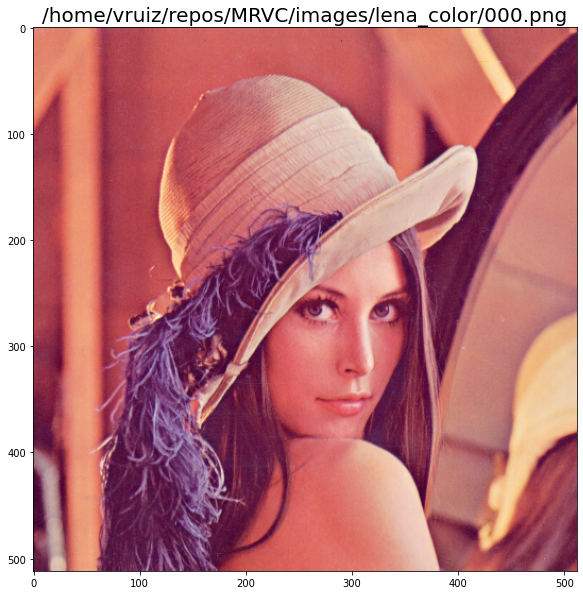

In [3]:
RGB_img = RGB_image.read(fn).astype(image_dtype)
RGB_image.show(RGB_img, fn + "000.png")

In [4]:
RGB_img.shape

(512, 512, 3)

In [5]:
RGB_img.dtype

dtype('uint8')

## (RGB -> color_DCT)-transform of the image

In [6]:
import numpy as np
from scipy.fftpack import dct, idct

DCT_type = 3
norm = "ortho" # Orthonormal: orthogonal + unitary (unit gain in both directions of the transform)
#norm = None

In [7]:
DCT_img = color_DCT.from_RGB(RGB_img)
print(DCT_img.dtype)

float64


[image_1.py:62 print_stats() INFO] max=409.60369602120556 min=54.44676949688022 avg=217.13040549266634


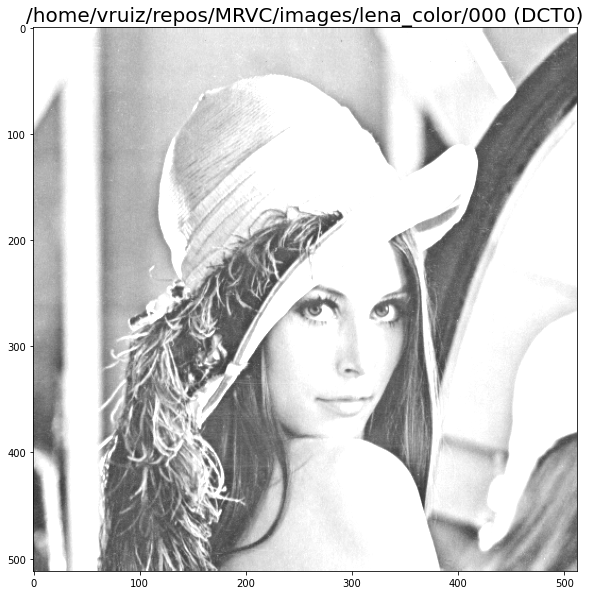

In [8]:
gray_image.show(DCT_img[..., 0], fn + "000 (DCT0)")

[image_1.py:62 print_stats() INFO] max=132.80755751870487 min=-101.44077534163273 avg=17.98332955505486


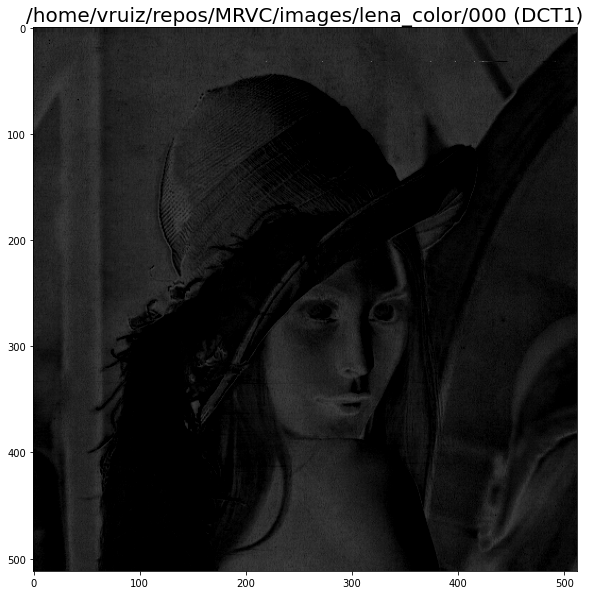

In [9]:
gray_image.show(DCT_img[..., 1], fn + "000 (DCT1)")

[image_1.py:62 print_stats() INFO] max=136.97111212319928 min=8.204460081654055 avg=77.04341443311425


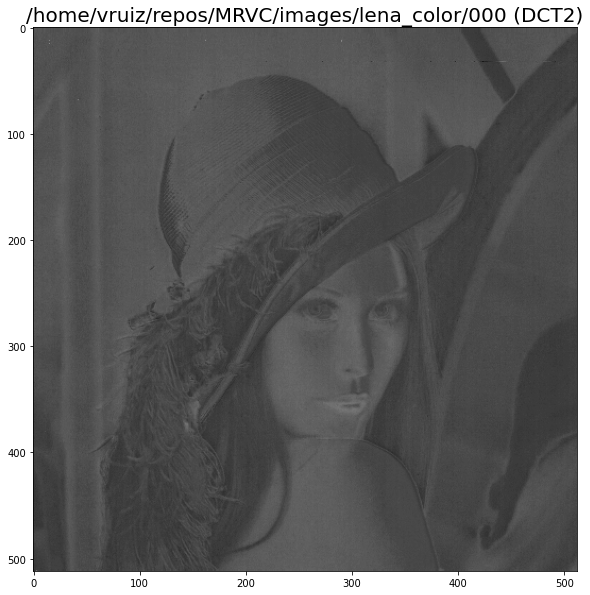

In [10]:
gray_image.show(DCT_img[..., 2], fn + "000 (DCT2)")

## Energy of the DCT components

In [11]:
energy_DCT0 = information.energy(DCT_img[..., 0])
energy_DCT1 = information.energy(DCT_img[..., 1])
energy_DCT2 = information.energy(DCT_img[..., 2])
print("energy_DCT0/energy_DCT1 =", energy_DCT0/energy_DCT1)
print("energy_DCT0/energy_DCT2 =", energy_DCT0/energy_DCT2)

energy_DCT0/energy_DCT1 = 63.44060764132677
energy_DCT0/energy_DCT2 = 8.733868052035167


As it can be seen:
1. Most of the energy is concentrated in the $\text{DCT}_0$ subband.
2. The coefficients can be positive and negative.
3. The dynamic range of the $\text{DCT}_0$ is more than twice the original one.

## Unitarity

In [12]:
DCT0_avg_energy = information.average_energy(DCT_img[..., 0])
DCT1_avg_energy = information.average_energy(DCT_img[..., 1])
DCT2_avg_energy = information.average_energy(DCT_img[..., 2])
print(f"Average energy of component DCT0 = {int(DCT0_avg_energy)}")
print(f"Average energy of component DCT1 = {int(DCT1_avg_energy)}")
print(f"Average energy of component DCT2 = {int(DCT2_avg_energy)}")
total_DCT_avg_energy = DCT0_avg_energy + DCT1_avg_energy + DCT2_avg_energy
print(f"Total average energy (computed by adding the energies of the DCT coefficients {int(DCT0_avg_energy)} + {int(DCT1_avg_energy)} + {int(DCT2_avg_energy)}) = {int(total_DCT_avg_energy)}")
print(f"Total RGB average energy (computed directly from the RGB image) = {int(information.average_energy(RGB_img)*3)}")

Average energy of component DCT0 = 52878
Average energy of component DCT1 = 833
Average energy of component DCT2 = 6054
Total average energy (computed by adding the energies of the DCT coefficients 52878 + 833 + 6054) = 59766
Total RGB average energy (computed directly from the RGB image) = 59766


Therefore, the forward DCT is energy preserving (unitary).

In [13]:
RGB_recons_img = color_DCT.to_RGB(DCT_img)
print(f"Total RGB average energy (computed from the reconstructed RGB image) = {int(information.average_energy(RGB_recons_img)*3)}")

Total RGB average energy (computed from the reconstructed RGB image) = 59766


And the same can be said about the backward transform.

## (RGB <-> color-DCT) transform error

[image_3.py:84 print_stats() INFO] component=0 max=255.00000000000006 min=54.00000000000001 avg=180.22401428222656
[image_3.py:84 print_stats() INFO] component=1 max=247.99999999999994 min=1.0000000000000142 avg=99.05646133422852
[image_3.py:84 print_stats() INFO] component=2 max=239.0 min=7.999999999999992 avg=105.41263198852539


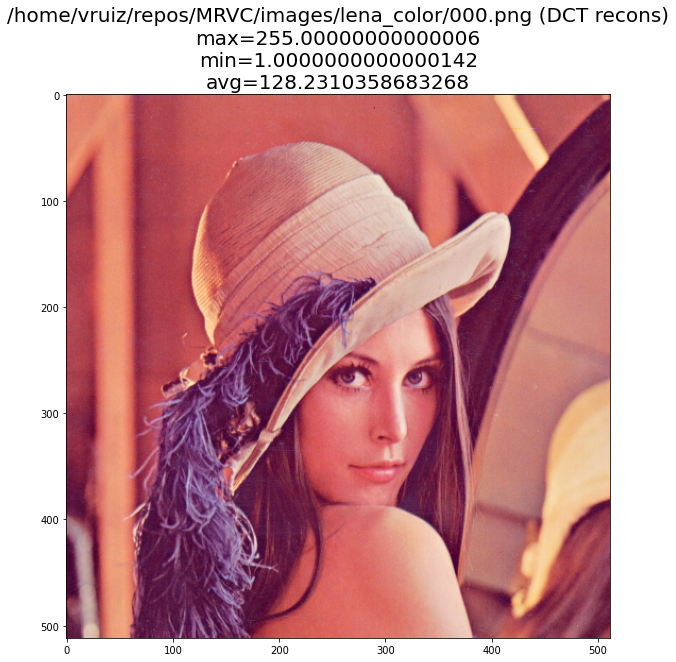

In [14]:
RGB_image.show_normalized(RGB_recons_img, fn + "000.png (DCT recons)")

In [15]:
np.array_equal(RGB_img, RGB_recons_img)

False

In [16]:
print(RGB_img.max(), RGB_img.min())

255 1


In [17]:
print(RGB_recons_img.max(), RGB_recons_img.min())

255.00000000000006 1.0000000000000142


[image_3.py:84 print_stats() INFO] component=0 max=1 min=0 avg=0.03585052490234375
[image_3.py:84 print_stats() INFO] component=1 max=1 min=0 avg=0.35077667236328125
[image_3.py:84 print_stats() INFO] component=2 max=1 min=0 avg=0.4992218017578125


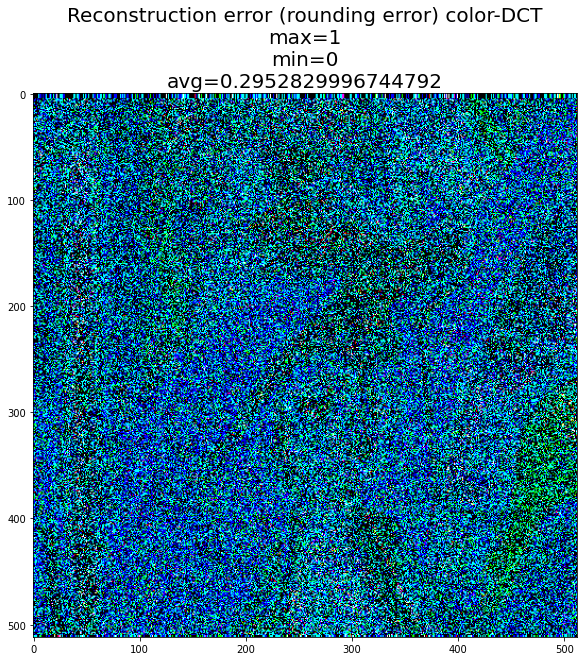

In [18]:
RGB_image.show_normalized(RGB_img - RGB_recons_img.astype(image_dtype), "Reconstruction error (rounding error) color-DCT")

The DCT transform is irreversible. In general, only integer arithmetic operations guarantees reversibility.

## Relative gains of the synthesis filters

The synthesis filters gains are important because the quantization steps of each color-DCT component should be adjusted in order to effectively provide the desired number of [bins](http://www.winlab.rutgers.edu/~crose/322_html/quantization.pdf) (different dequantized values) in each component.

In [19]:
def print_info(val):
    DCT0_delta = np.array([val, 0, 0])
    RGB_DCT0_delta = idct(DCT0_delta, type=DCT_type, norm=norm)
    RGB_energy_DCT0_delta = information.energy(RGB_DCT0_delta)
    
    DCT1_delta = np.array([0, val, 0])
    RGB_DCT1_delta = idct(DCT1_delta, type=DCT_type, norm=norm)
    RGB_energy_DCT1_delta = information.energy(RGB_DCT1_delta)
    
    DCT2_delta = np.array([0, 0, val])
    RGB_DCT2_delta = idct(DCT2_delta, type=DCT_type, norm=norm)
    RGB_energy_DCT2_delta = information.energy(RGB_DCT2_delta)
    
    zero = np.array([0, 0, 0])
    RGB_zero = idct(zero, type=DCT_type, norm=norm)
    RGB_energy_zero = information.energy(RGB_zero)
    
    print(f"{val}^2 = {val*val}")
    
    print(f"Energy of {DCT0_delta} in the RGB domain ({RGB_DCT0_delta}) = {RGB_energy_DCT0_delta}")
    print(f"Energy of {DCT1_delta} in the RGB domain ({RGB_DCT1_delta}) = {RGB_energy_DCT1_delta}")
    print(f"Energy of {DCT2_delta} in the RGB domain ({RGB_DCT2_delta}) = {RGB_energy_DCT2_delta}")
    print(f"Energy of {zero} in the RGB domain ({RGB_zero}) = {RGB_energy_zero}")
    
    max_ = max(RGB_energy_DCT0_delta, RGB_energy_DCT1_delta, RGB_energy_DCT2_delta)
    DCT0_relative_gain = RGB_energy_DCT0_delta / max_
    DCT1_relative_gain = RGB_energy_DCT1_delta / max_
    DCT2_relative_gain = RGB_energy_DCT2_delta / max_
    print(f"Relative gain of DCT0 component = {DCT0_relative_gain}")
    print(f"Relative gain of DCT1 component = {DCT1_relative_gain}")
    print(f"Relative gain of DCT2 component = {DCT2_relative_gain}")
    
print_info(255)
print()
print_info(1)
print()
print_info(0)

255^2 = 65025
Energy of [255   0   0] in the RGB domain ([147.22431864 180.3122292  104.10331407]) = 65025.000000000015
Energy of [  0 255   0] in the RGB domain ([ 147.22431864    0.         -208.20662814]) = 65024.999999999985
Energy of [  0   0 255] in the RGB domain ([ 147.22431864 -180.3122292   104.10331407]) = 65024.99999999999
Energy of [0 0 0] in the RGB domain ([0. 0. 0.]) = 0.0
Relative gain of DCT0 component = 1.0
Relative gain of DCT1 component = 0.9999999999999996
Relative gain of DCT2 component = 0.9999999999999997

1^2 = 1
Energy of [1 0 0] in the RGB domain ([0.57735027 0.70710678 0.40824829]) = 1.0
Energy of [0 1 0] in the RGB domain ([ 0.57735027  0.         -0.81649658]) = 1.0
Energy of [0 0 1] in the RGB domain ([ 0.57735027 -0.70710678  0.40824829]) = 1.0000000000000002
Energy of [0 0 0] in the RGB domain ([0. 0. 0.]) = 0.0
Relative gain of DCT0 component = 0.9999999999999998
Relative gain of DCT1 component = 0.9999999999999998
Relative gain of DCT2 component = 1.

/tmp/ipykernel_3662820/1564925035.py:26: RuntimeWarning: invalid value encountered in double_scalars
  DCT0_relative_gain = RGB_energy_DCT0_delta / max_
/tmp/ipykernel_3662820/1564925035.py:27: RuntimeWarning: invalid value encountered in double_scalars
  DCT1_relative_gain = RGB_energy_DCT1_delta / max_
/tmp/ipykernel_3662820/1564925035.py:28: RuntimeWarning: invalid value encountered in double_scalars
  DCT2_relative_gain = RGB_energy_DCT2_delta / max_


The gain of each color-DCT inverse filter is 1. Therefore, under bit-rate restrictions, the optimal quantization pattern (without considering other aspects such as the compresibility of each component) is $\Delta_{\text{DCT0}} = \Delta_{\text{DCT1}} = \Delta_{\text{DCT2}}$.

## Amplitude shift in the DCT domain

To decide how to quantize, it is necessary to known how the amplitudes of the original image are *translated* to the transform domain. A good choice to find out this is to transform noise. In our case, lets use a random image with ([normal](https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html)) [Gaussian noise](https://en.wikipedia.org/wiki/Gaussian_noise) with mean 0, color-DCT it, and check where the transformed noise has its mean in each component. Notice that, by definition, the noise cannot be decorrelated by transforms, and therefore, the noise is simply *transfered* from the RGB domain to the transform domain. Thus, depending on where the transformed noise has the mean, we can decide if the signal must be shifted before or after the transform. Notice that the input signal to a dead-zone quantizer must have 0 mean.

In [20]:
# loc = mean, scale=standard deviation, size=number of samples
RGB_noise = np.random.normal(loc=0, scale=10, size=512*512*3).reshape(512, 512, 3)

[image.py:725 set_data() WARNING] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
[image_3.py:84 print_stats() INFO] component=0 max=44.145122478920285 min=-46.24179186103943 avg=0.029756131366482717
[image_3.py:84 print_stats() INFO] component=1 max=44.464662399525785 min=-48.6796179873062 avg=-0.008398479918421093
[image_3.py:84 print_stats() INFO] component=2 max=47.32647866410364 min=-47.36305811194523 avg=-0.009222719082608884


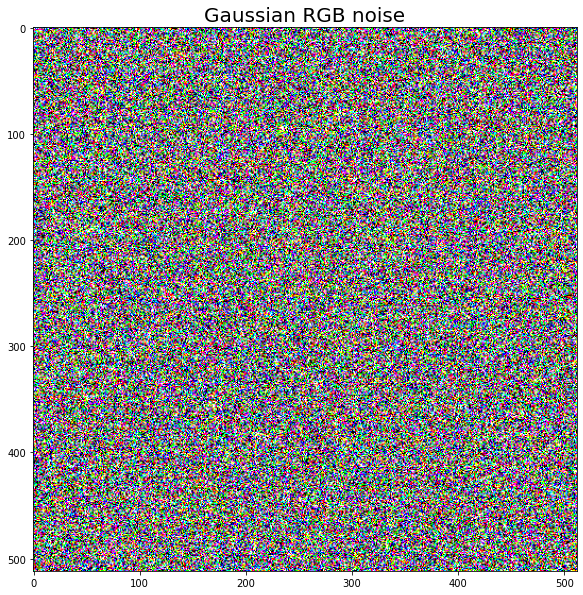

In [21]:
RGB_image.show(RGB_noise, "Gaussian RGB noise")

In [22]:
DCT_noise = color_DCT.from_RGB(RGB_noise)

[image_1.py:62 print_stats() INFO] max=44.73495910192794 min=-48.76781215763288 avg=0.007475929053602545


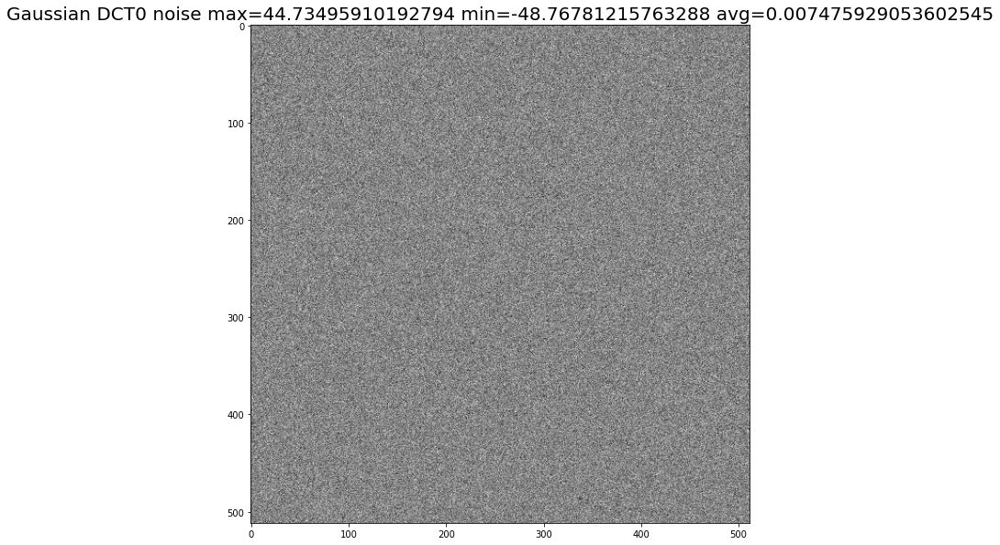

In [23]:
gray_image.show_normalized(DCT_noise[..., 0], "Gaussian DCT0 noise")

[image_1.py:62 print_stats() INFO] max=45.36474060028013 min=-41.36567948650799 avg=0.024710029052287714


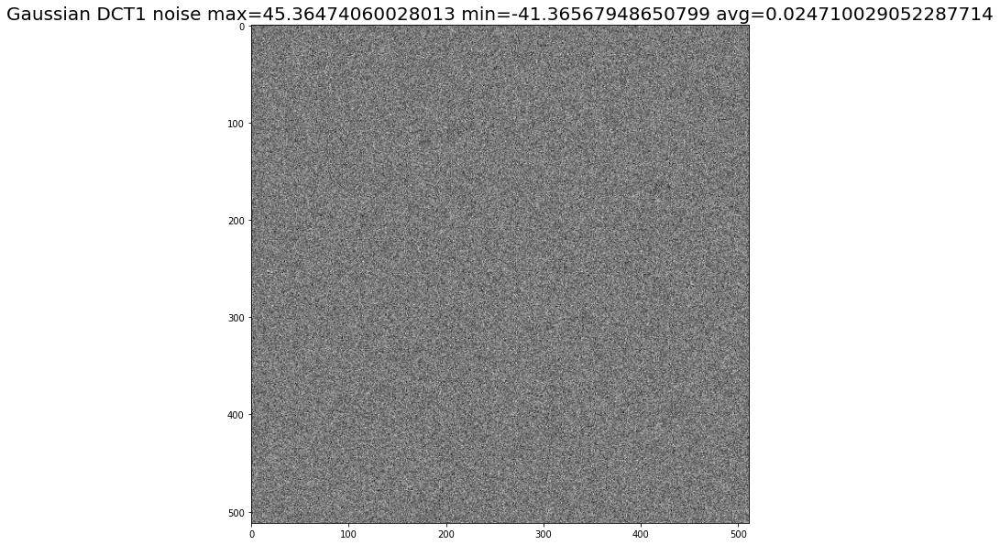

In [24]:
gray_image.show_normalized(DCT_noise[..., 1], "Gaussian DCT1 noise")

[image_1.py:62 print_stats() INFO] max=44.13840707043663 min=-45.80925083892581 avg=0.01935317325755174


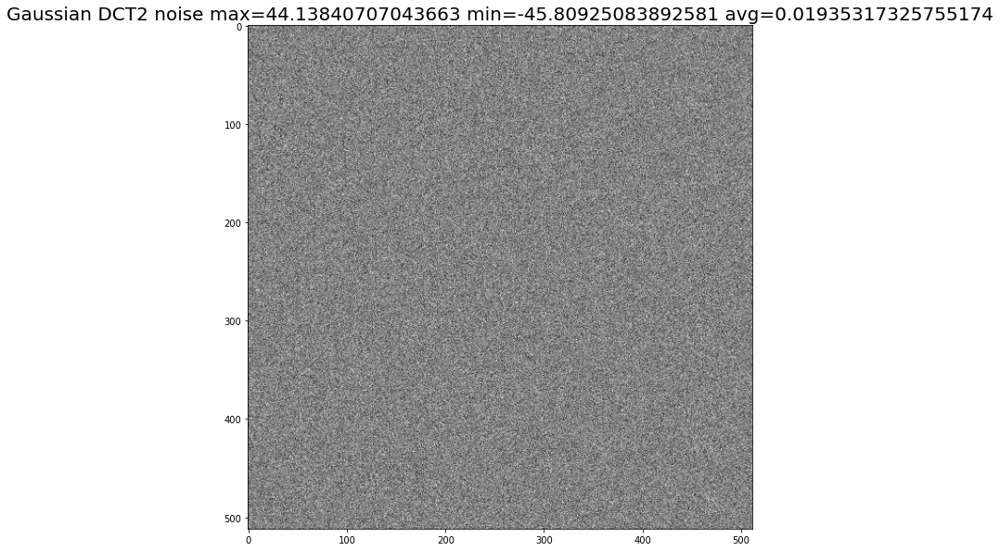

In [25]:
gray_image.show_normalized(DCT_noise[..., 2], "Gaussian DCT2 noise")

The color-DCT does not modify the mean of the image (at least, when it has a 0 mean).

## Simple quantization in the color-DCT domain ($\Delta_{\text{DCT0}} = \Delta_{\text{DCT1}} = \Delta_{\text{DCT2}}$)
Since the transform is orthogonal, the distortion can be measured in both, the RGB and the color-DCT domains.

[image_3.py:84 print_stats() INFO] component=0 max=128 min=-128 avg=0.32958984375
[image_3.py:84 print_stats() INFO] component=1 max=0 min=0 avg=0.0
[image_3.py:84 print_stats() INFO] component=2 max=0 min=0 avg=0.0
[image_3.py:53 write() DEBUG] optipng 128_000.png


q_step=128
(Reconstructed components) max=128 min=-128 avg=0.10986328125 dtype=int64
(Quantization indexes) max=129 min=127 avg=128.00085830688477 dtype=uint8


** Processing: 128_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 2 bits/pixel, 3 colors in palette
Input IDAT size = 15541 bytes
Input file size = 15610 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 9632
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 9432
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 9432

Output IDAT size = 9432 bytes (6109 bytes decrease)
Output file size = 9510 bytes (6100 bytes = 39.08% decrease)

[image_3.py:58 write() INFO] 128_000.png (512, 512, 3) uint8 len=9510 max=129 min=127
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-128 avg=-1.95361328125
[image_3.py:84 print_stats() INFO] component=1 max=64 min=-64 avg=-0.39501953125
[image_3.py:84 print_stats() INFO] component=2 max=0 min=-64 avg=-0.000244140625


Used quantization indexes: [127 128 129]
rate=0.09674072265625 bits/pixel, distortion=39.83517946665161
q_step=64
(Reconstructed components) max=192 min=-128 avg=-0.782958984375 dtype=int64
(Quantization indexes) max=131 min=126 avg=127.98776626586914 dtype=uint8


[image_3.py:53 write() DEBUG] optipng 64_000.png
** Processing: 64_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 4 bits/pixel, 12 colors in palette
Input IDAT size = 29685 bytes
Input file size = 29778 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 23569
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 23385
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 23385

Output IDAT size = 23385 bytes (6300 bytes decrease)
Output file size = 23490 bytes (6288 bytes = 21.12% decrease)

[image_3.py:58 write() INFO] 64_000.png (512, 512, 3) uint8 len=23490 max=131 min=126
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-160 avg=-1.42626953125
[image_3.py:84 print_stats() INFO] component=1 max=96 min=-96 avg=-1.87548828125
[image_3.py:84 print_stats() INFO] component=2 max=32 min=-64 avg=0.0198974609375


Used quantization indexes: [126 127 128 129 130 131]
rate=0.23895263671875 bits/pixel, distortion=25.05024366175513
q_step=32
(Reconstructed components) max=192 min=-160 avg=-1.0939534505208333 dtype=int64
(Quantization indexes) max=134 min=123 avg=127.96581395467122 dtype=uint8


[image_3.py:53 write() DEBUG] optipng 32_000.png
** Processing: 32_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 8 bits/pixel, 54 colors in palette
Input IDAT size = 67111 bytes
Input file size = 67264 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 56433
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 56433

Output IDAT size = 56433 bytes (10678 bytes decrease)
Output file size = 56664 bytes (10600 bytes = 15.76% decrease)

[image_3.py:58 write() INFO] 32_000.png (512, 512, 3) uint8 len=56664 max=134 min=123
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-160 avg=-0.7744140625
[image_3.py:84 print_stats() INFO] component=1 max=112 min=-112 avg=-0.417236328125
[image_3.py:84 print_stats() INFO] component=2 max=48 min=-64 avg=-0.06988525390625


Used quantization indexes: [123 124 125 126 127 128 129 130 131 132 133 134]
rate=0.576416015625 bits/pixel, distortion=15.535069770841584
q_step=16
(Reconstructed components) max=192 min=-160 avg=-0.4205118815104167 dtype=int64
(Quantization indexes) max=140 min=118 avg=127.9737180074056 dtype=uint8


[image_3.py:53 write() DEBUG] optipng 16_000.png
** Processing: 16_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 136816 bytes
Input file size = 137065 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 136816
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 135498
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 135498

Output IDAT size = 135498 bytes (1318 bytes decrease)
Output file size = 135555 bytes (1510 bytes = 1.10% decrease)

[image_3.py:58 write() INFO] 16_000.png (512, 512, 3) uint8 len=135555 max=140 min=118
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-160 avg=-0.37091064453125
[image_3.py:84 print_stats() INFO] component=1 max=112 min=-112 avg=-0.212554931640625
[image_3.py:84 print_stats() INFO] component=2 max=56 min=-64 avg=0.026763916015625


Used quantization indexes: [118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135
 136 137 138 139 140]
rate=1.378936767578125 bits/pixel, distortion=8.749876461491928
q_step=8
(Reconstructed components) max=192 min=-160 avg=-0.18556722005208334 dtype=int64
(Quantization indexes) max=152 min=108 avg=127.97680409749348 dtype=uint8


[image_3.py:53 write() DEBUG] optipng 8_000.png
** Processing: 8_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 219881 bytes
Input file size = 220250 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 219881
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 214444
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 191582
                               
Selecting parameters:
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 191582

Output IDAT size = 191582 bytes (28299 bytes decrease)
Output file size = 191639 bytes (28611 bytes = 12.99% decrease)

[image_3.py:58 write() INFO] 8_000.png (512, 512, 3) uint8 len=191639 max=152 min=108
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-160 avg=-0.1871185302734375
[image_3.py:84 print_stats() INFO] component=1 max=112 min=-116 avg=-0.110107421875
[image_3.py:84 print_stats() INFO] component=2 max=56 min=-68 avg=0.0271453857421875


Used quantization indexes: [108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152]
rate=1.9494527180989583 bits/pixel, distortion=4.468467426051951
q_step=4
(Reconstructed components) max=192 min=-160 avg=-0.09002685546875 dtype=int64
(Quantization indexes) max=176 min=88 avg=127.97749328613281 dtype=uint8


[image_3.py:53 write() DEBUG] optipng 4_000.png
** Processing: 4_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 315276 bytes
Input file size = 315789 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 315276
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 299560
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 277472
                               
Selecting parameters:
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 277472

Output IDAT size = 277472 bytes (37804 bytes decrease)
Output file size = 277529 bytes (38260 bytes = 12.12% decrease)

[image_3.py:58 write() INFO] 4_000.png (512, 512, 3) uint8 len=277529 max=176 min=88
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-162 avg=-0.09423065185546875
[image_3.py:84 print_stats() INFO] component=1 max=114 min=-118 avg=-0.055816650390625
[image_3.py:84 print_stats() INFO] component=2 max=58 min=-68 avg=0.01172637939453125
[image_3.py:53 write() DEBUG] optipng 2_000.png


Used quantization indexes: [ 88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105
 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123
 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141
 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176]
rate=2.8231709798177085 bits/pixel, distortion=2.276466393883493
q_step=2
(Reconstructed components) max=192 min=-162 avg=-0.046106974283854164 dtype=int64
(Quantization indexes) max=224 min=47 avg=127.97694651285808 dtype=uint8


** Processing: 2_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 411779 bytes
Input file size = 412436 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 411779
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 376371
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 368860
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 368224

Selecting parameters:
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 368224

Output IDAT size = 368224 bytes (43555 bytes decrease)
Output file size = 368281 bytes (44155 bytes = 10.71% decrease)

[image_3.py:58 write() INFO] 2_000.png (512, 512, 3) uint8 len=368281 max=224 min=47
[image_3.py:84 print_stats() INFO] component=0 max=192 min=-162 avg=-0.047847747802734375
[image_3.py:84 print_stats() INFO] component=1 max=114 min=-119 avg=-0.02756500244140625
[image_3.py:84 print_stats() INFO] component=2 max=59 min=-68 avg=0.00685882568359375
[image_3.py:53 write() DEBUG] optipng 1_000.png
** Processing: 1_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input

Used quantization indexes: [ 47  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65
  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83
  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101
 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119
 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137
 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209
 210 211 212 213 214 215 216 219 220 223 224]
rate=3.7463480631510415 bits/pixel, distortion=1.1475728398779663
q_step=1
(Reconstructed components) max=192 min=-162 avg=-0.022851308186848957 dtype=int64
(Quantization indexes) max=255 min=0 avg=127.41985702514648 dtype=uint8


  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 512832
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 472010
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 471573

Selecting parameters:
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 471573

Output IDAT size = 471573 bytes (41259 bytes decrease)
Output file size = 471630 bytes (42003 bytes = 8.18% decrease)

[image_3.py:58 write() INFO] 1_000.png (512, 512, 3) uint8 len=471630 max=255 min=0


Used quantization indexes: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239

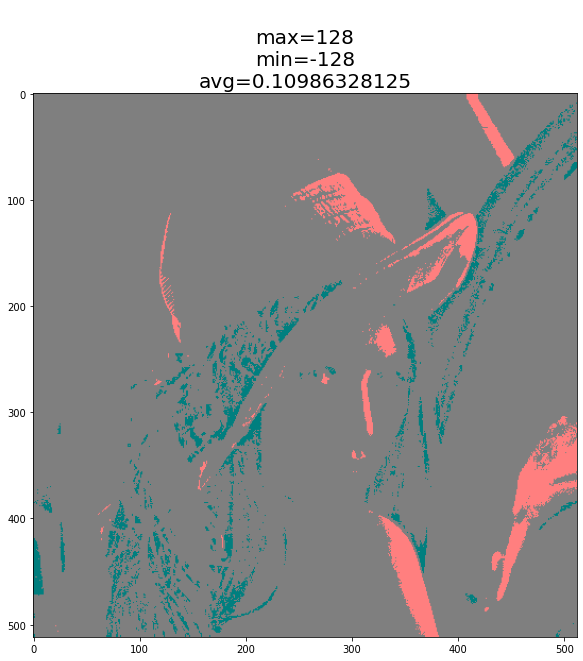

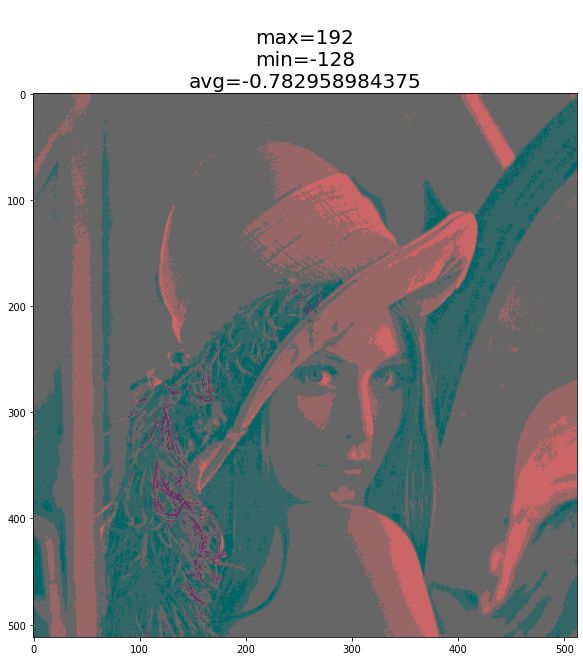

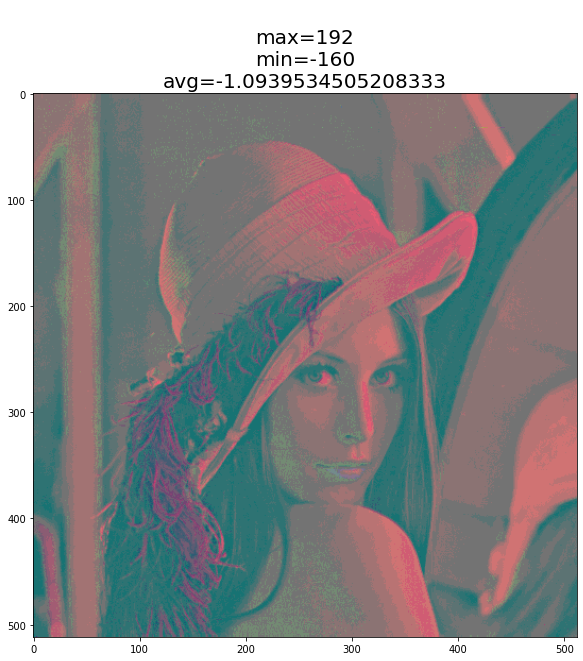

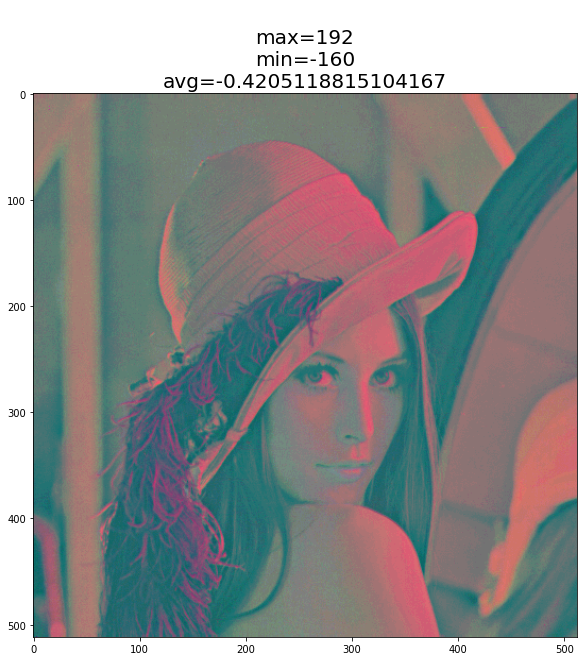

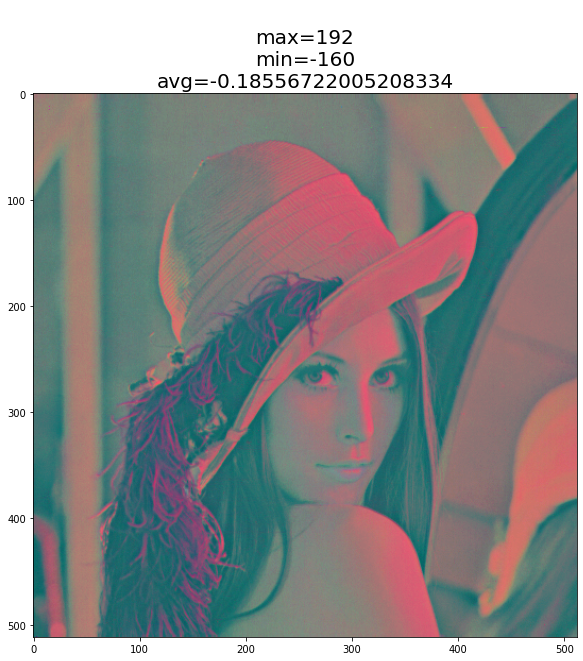

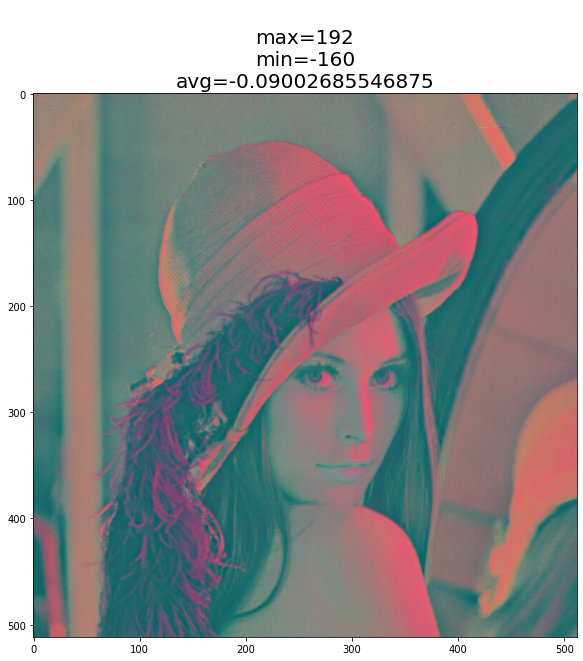

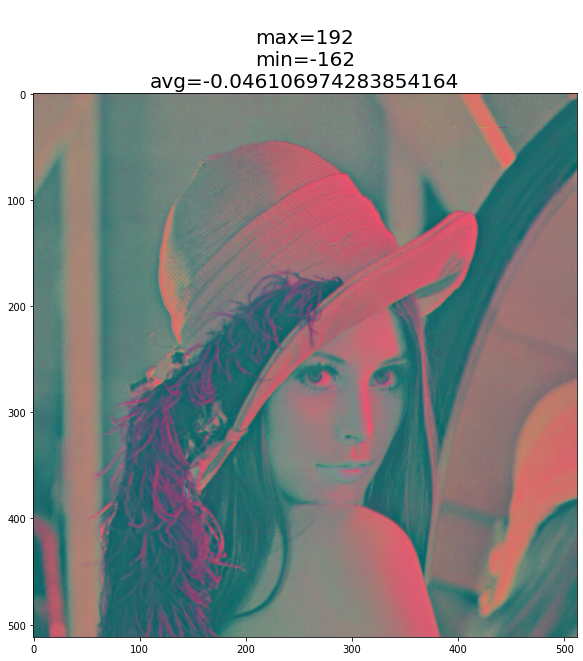

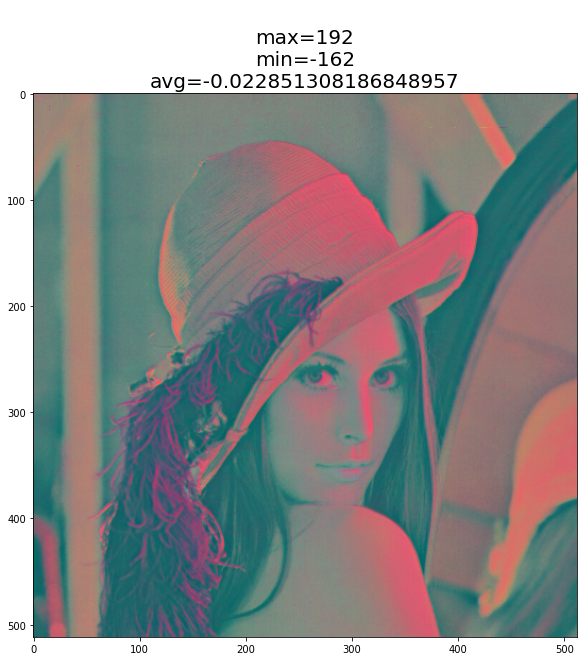

In [37]:
def DCT_same_delta_RD_curve_DCTdistortion(RGB_img, Q_steps, quantizer):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    DCT_img = color_DCT.from_RGB(RGB_img)
    points = []
    for Q_step in Q_steps:
        print(f"q_step={Q_step}")
        Q = quantizer(Q_step=Q_step)
        DCT_y, k = Q.quan_dequan(DCT_img)
        RGB_image.show_normalized(DCT_y)
        print(f"(Reconstructed components) max={np.max(DCT_y)} min={np.min(DCT_y)} avg={np.average(DCT_y)} dtype={DCT_y.dtype}")
        data_to_encode = (k + 128).astype(np.uint8)
        print(f"(Quantization indexes) max={np.max(data_to_encode)} min={np.min(data_to_encode)} avg={np.average(data_to_encode)} dtype={data_to_encode.dtype}")
        #BPP = common.bits_per_color_pixel(data_to_encode, str(Q_step) + '_')
        BPP = RGB_image.write(data_to_encode, str(Q_step) + '_', 0)*8/data_to_encode.size
        print("Used quantization indexes:", np.unique(data_to_encode))
        RMSE = distortion.RMSE(DCT_img, DCT_y)
        points.append((BPP, RMSE))
        print(f"rate={BPP} bits/pixel, distortion={RMSE}")
    return points

DCT_same_delta_RD_points_DCTdistortion = DCT_same_delta_RD_curve_DCTdistortion(RGB_img, Q_steps, quantizer)

[image_3.py:53 write() DEBUG] optipng 128_000.png
** Processing: 128_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 2 bits/pixel, 3 colors in palette
Input IDAT size = 15541 bytes
Input file size = 15610 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 9632
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 9432
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 9432

Output IDAT size = 9432 bytes (6109 bytes decrease)
Output file size = 9510 bytes (6100 bytes = 39.08% decrease)

[image_3.py:58 write() INFO] 128_000.png (512, 512, 3) uint8 len=9510 max=129 min=127


Used quantization indexes: [127 128 129]


[image_3.py:84 print_stats() INFO] component=0 max=73 min=-73 avg=0.18796920776367188
[image_3.py:84 print_stats() INFO] component=1 max=90 min=-90 avg=0.23174285888671875
[image_3.py:84 print_stats() INFO] component=2 max=52 min=-52 avg=0.1338958740234375
[image_3.py:53 write() DEBUG] optipng 64_000.png
** Processing: 64_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 4 bits/pixel, 12 colors in palette
Input IDAT size = 29685 bytes
Input file size = 29778 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0

q_step=128, rate=0.09674072265625 bits/pixel, distortion=39.84141693244521


		IDAT size = 23569
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 23385
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 0		IDAT size = 23385

Output IDAT size = 23385 bytes (6300 bytes decrease)
Output file size = 23490 bytes (6288 bytes = 21.12% decrease)

[image_3.py:58 write() INFO] 64_000.png (512, 512, 3) uint8 len=23490 max=131 min=126


Used quantization indexes: [126 127 128 129 130 131]


[image_3.py:84 print_stats() INFO] component=0 max=110 min=-73 avg=-1.3186759948730469
[image_3.py:84 print_stats() INFO] component=1 max=135 min=-90 avg=-1.3734626770019531
[image_3.py:84 print_stats() INFO] component=2 max=104 min=-52 avg=-0.47280120849609375


q_step=64, rate=0.23895263671875 bits/pixel, distortion=25.194211139103952


[image_3.py:53 write() DEBUG] optipng 32_000.png
** Processing: 32_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Reducing image to 8 bits/pixel, 54 colors in palette
Input IDAT size = 67111 bytes
Input file size = 67264 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 56433
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 0  f = 0		IDAT size = 56433

Output IDAT size = 56433 bytes (10678 bytes decrease)
Output file size = 56664 bytes (10600 bytes = 15.76% decrease)

[image_3.py:58 write() INFO] 32_000.png (512, 512, 3) uint8 len=56664 max=134 min=123


Used quantization indexes: [123 124 125 126 127 128 129 130 131 132 133 134]


[image_3.py:84 print_stats() INFO] component=0 max=92 min=-92 avg=-1.9246978759765625
[image_3.py:84 print_stats() INFO] component=1 max=135 min=-113 avg=-1.0235939025878906
[image_3.py:84 print_stats() INFO] component=2 max=117 min=-91 avg=0.9524955749511719


q_step=32, rate=0.576416015625 bits/pixel, distortion=15.745615109859788


[image_3.py:53 write() DEBUG] optipng 16_000.png
** Processing: 16_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 136816 bytes
Input file size = 137065 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 136816
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 135498
                               
Selecting parameters:
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 135498

Output IDAT size = 135498 bytes (1318 bytes decrease)
Output file size = 135555 bytes (1510 bytes = 1.10% decrease)

[image_3.py:58 write() INFO] 16_000.png (512, 512, 3) uint8 len=135555 max=140 min=118


Used quantization indexes: [118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135
 136 137 138 139 140]


[image_3.py:84 print_stats() INFO] component=0 max=83 min=-110 avg=-0.8121147155761719
[image_3.py:84 print_stats() INFO] component=1 max=135 min=-101 avg=-0.5301094055175781
[image_3.py:84 print_stats() INFO] component=2 max=124 min=-91 avg=0.007907867431640625


q_step=16, rate=1.378936767578125 bits/pixel, distortion=9.018046443758639


[image_3.py:53 write() DEBUG] optipng 8_000.png
** Processing: 8_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 219881 bytes
Input file size = 220250 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 219881
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 214444
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 191582
                               
Selecting parameters:
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 191582

Output IDAT size = 191582 bytes (28299 bytes decrease)
Output file size = 191639 bytes (28611 bytes = 12.99% decrease)

[image_3.py:58 write() INFO] 8_000.png (512, 512, 3) uint8 len=191639 max=152 min=108


Used quantization indexes: [108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152]


[image_3.py:84 print_stats() INFO] component=0 max=83 min=-120 avg=-0.4178886413574219
[image_3.py:84 print_stats() INFO] component=1 max=141 min=-96 avg=-0.2740440368652344
[image_3.py:84 print_stats() INFO] component=2 max=127 min=-94 avg=0.08489990234375


q_step=8, rate=1.9494527180989583 bits/pixel, distortion=4.775520425481649


[image_3.py:53 write() DEBUG] optipng 4_000.png
** Processing: 4_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 315276 bytes
Input file size = 315789 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 315276
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 299560
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 277472
                               
Selecting parameters:
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 277472

Output IDAT size = 277472 bytes (37804 bytes decrease)
Output file size = 277529 bytes (38260 bytes = 12.12% decrease)

[image_3.py:58 write() INFO] 4_000.png (512, 512, 3) uint8 len=277529 max=176 min=88


Used quantization indexes: [ 88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105
 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123
 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141
 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176]


[image_3.py:84 print_stats() INFO] component=0 max=78 min=-124 avg=-0.24634933471679688
[image_3.py:84 print_stats() INFO] component=1 max=147 min=-98 avg=-0.15198135375976562
[image_3.py:84 print_stats() INFO] component=2 max=129 min=-96 avg=0.0718231201171875
[image_3.py:53 write() DEBUG] optipng 2_000.png
** Processing: 2_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 411779 bytes
Input file size = 412436 bytes

Trying:
  zc = 1  zm = 8  zs = 2  f = 0

q_step=4, rate=2.8231709798177085 bits/pixel, distortion=2.593805689196962


  zc = 9  zm = 8  zs = 0  f = 5		IDAT size = 411779
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 376371
  zc = 1  zm = 8  zs = 2  f = 5		IDAT size = 368860
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 368224

Selecting parameters:
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 368224

Output IDAT size = 368224 bytes (43555 bytes decrease)
Output file size = 368281 bytes (44155 bytes = 10.71% decrease)

[image_3.py:58 write() INFO] 2_000.png (512, 512, 3) uint8 len=368281 max=224 min=47


Used quantization indexes: [ 47  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65
  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83
  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101
 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119
 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137
 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209
 210 211 212 213 214 215 216 219 220 223 224]


[image_3.py:84 print_stats() INFO] component=0 max=76 min=-124 avg=-0.17160797119140625
[image_3.py:84 print_stats() INFO] component=1 max=148 min=-98 avg=-0.0674285888671875
[image_3.py:84 print_stats() INFO] component=2 max=132 min=-97 avg=0.0585784912109375
[image_3.py:53 write() DEBUG] optipng 1_000.png
** Processing: 1_000.png
512x512 pixels, 3x8 bits/pixel, RGB
Input IDAT size = 512832 bytes
Input file size = 513633 bytes

Trying:
  zc = 9  zm = 8  zs = 0  f = 5

q_step=2, rate=3.7463480631510415 bits/pixel, distortion=1.5014425466498476


		IDAT size = 512832
  zc = 9  zm = 8  zs = 1  f = 5		IDAT size = 472010
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 471573

Selecting parameters:
  zc = 9  zm = 8  zs = 3  f = 5		IDAT size = 471573

Output IDAT size = 471573 bytes (41259 bytes decrease)
Output file size = 471630 bytes (42003 bytes = 8.18% decrease)

[image_3.py:58 write() INFO] 1_000.png (512, 512, 3) uint8 len=471630 max=255 min=0


Used quantization indexes: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239

[image_3.py:84 print_stats() INFO] component=0 max=75 min=-125 avg=-0.14970016479492188
[image_3.py:84 print_stats() INFO] component=1 max=148 min=-98 avg=-0.035129547119140625
[image_3.py:84 print_stats() INFO] component=2 max=133 min=-97 avg=0.049823760986328125


q_step=1, rate=4.79766845703125 bits/pixel, distortion=0.9774066628199386


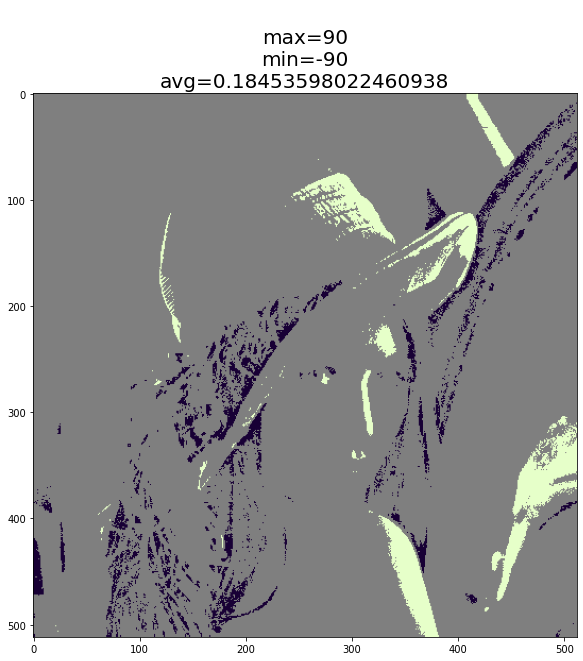

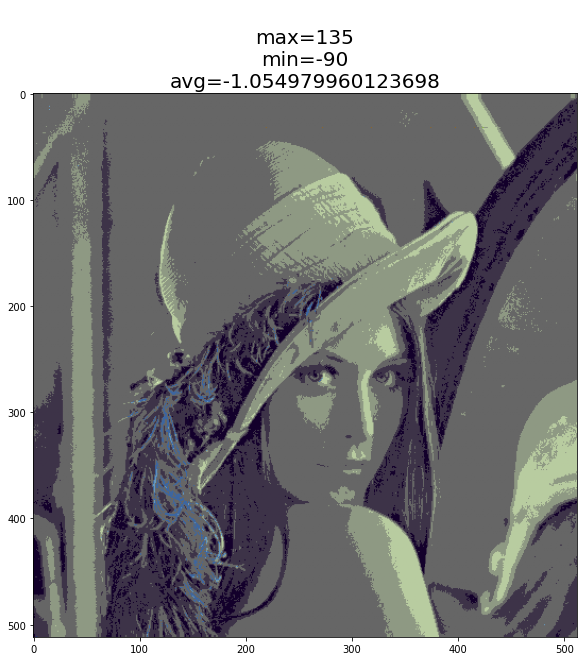

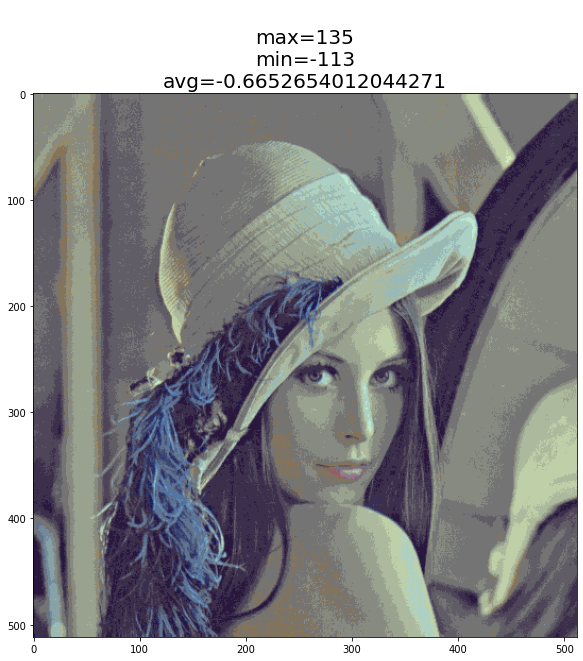

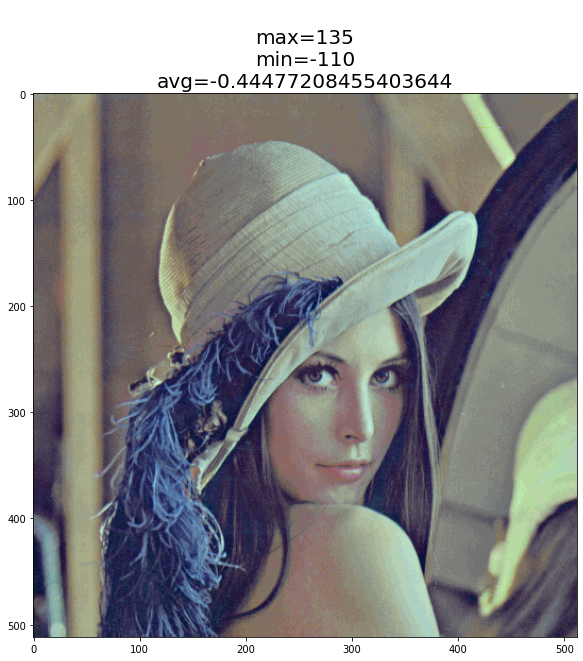

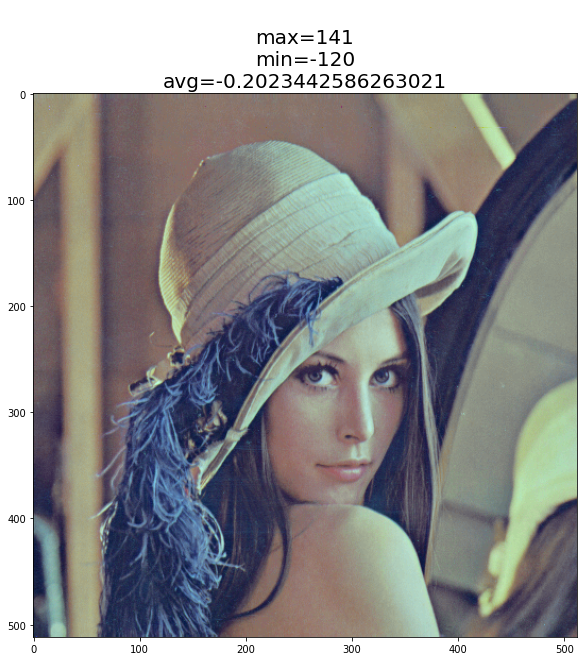

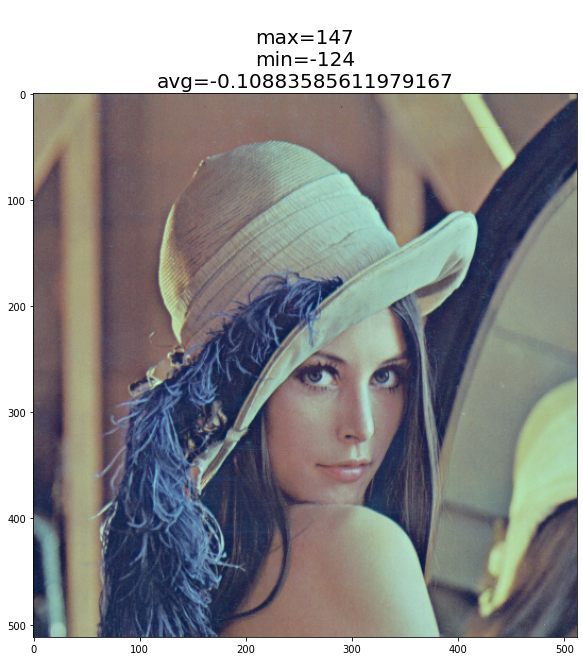

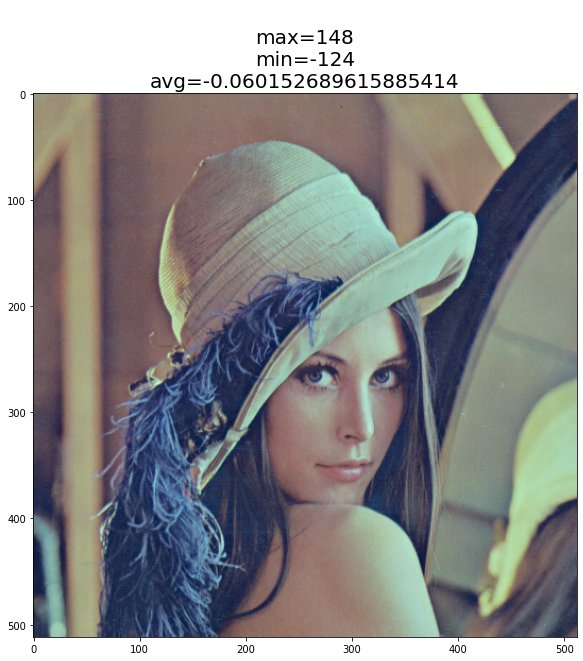

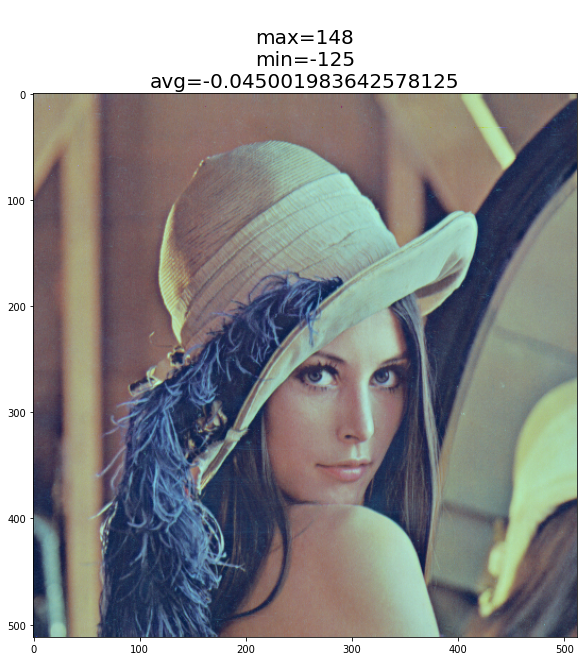

In [38]:
def DCT_same_delta_RD_curve_RGBdistortion(RGB_img, Q_steps, quantizer):
    RGB_img = RGB_img.astype(float)
    avg0 = np.average(RGB_img[..., 0])
    avg1 = np.average(RGB_img[..., 1])
    avg2 = np.average(RGB_img[..., 2])
    RGB_img[..., 0] -= avg0
    RGB_img[..., 1] -= avg1
    RGB_img[..., 2] -= avg2
    DCT_img = color_DCT.from_RGB(RGB_img)
    points = []
    for Q_step in Q_steps:
        Q = quantizer(Q_step=Q_step)
        DCT_y, k = Q.quan_dequan(DCT_img)
        data_to_encode = (k + 128).astype(np.uint8)
        #BPP = common.bits_per_color_pixel(data_to_encode, str(Q_step) + '_')
        BPP = RGB_image.write(data_to_encode, str(Q_step) + '_', 0)*8/data_to_encode.size
        print("Used quantization indexes:", np.unique(data_to_encode))
        RGB_y = color_DCT.to_RGB(DCT_y)
        RMSE = distortion.RMSE(RGB_img, RGB_y)
        RGB_image.show_normalized(RGB_y, '')
        points.append((BPP, RMSE))
        print(f"q_step={Q_step}, rate={BPP} bits/pixel, distortion={RMSE}")
    return points

DCT_same_delta_RD_points_RGBdistortion = DCT_same_delta_RD_curve_RGBdistortion(RGB_img, Q_steps, quantizer)

## Let's see the RD curve

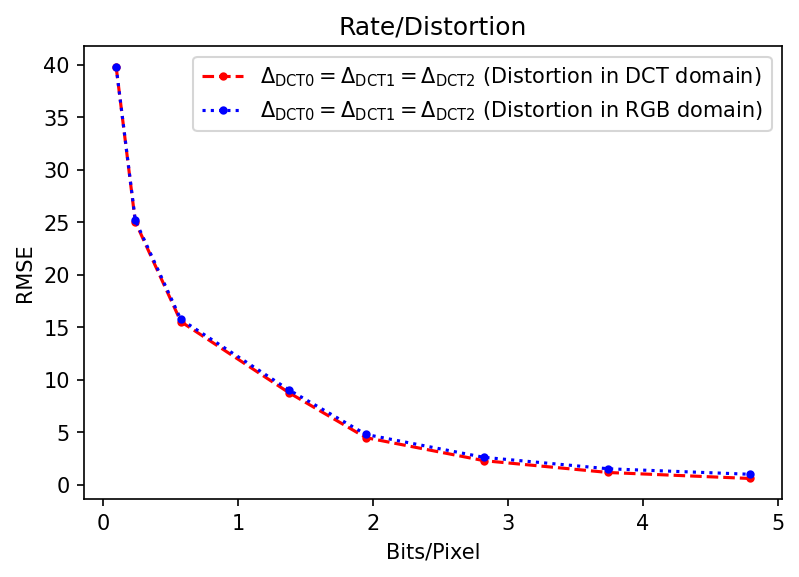

In [39]:
pylab.figure(dpi=150)
pylab.plot(*zip(*DCT_same_delta_RD_points_DCTdistortion), c='r', marker='.', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$ (Distortion in DCT domain)", linestyle="dashed")
pylab.plot(*zip(*DCT_same_delta_RD_points_RGBdistortion), c='b', marker='.', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$ (Distortion in RGB domain)", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

The distortion can be measured in both domains, DCT and RGB. (Again) This is true because the DCT is orthogonal.

## Comparison with compressing directly in the RGB domain

In [40]:
RGB_points = []
with open(f'../05-RGB_compression/RGB.txt', 'r') as f:
    for line in f:
        rate, _distortion = line.split('\t')
        RGB_points.append((float(rate), float(_distortion)))

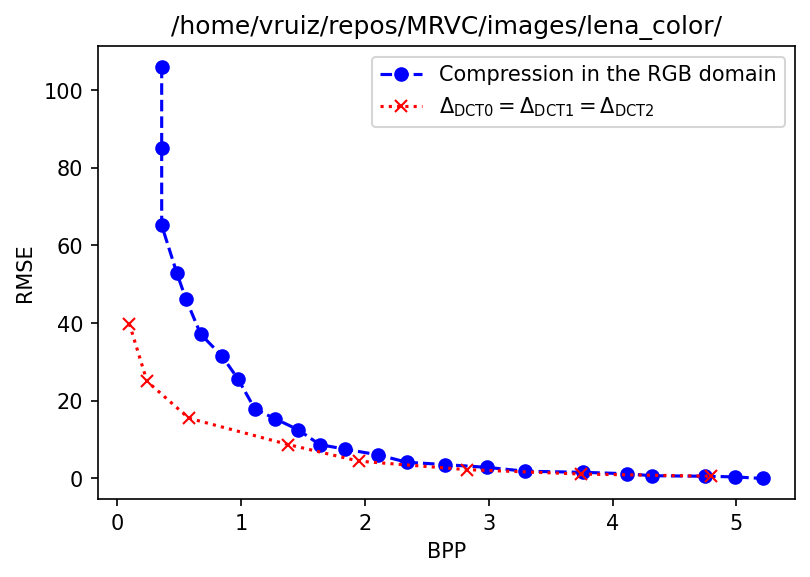

In [41]:
pylab.figure(dpi=150)
pylab.plot(*zip(*RGB_points), c='b', marker='o', label="Compression in the RGB domain", linestyle="dashed")
pylab.plot(*zip(*DCT_same_delta_RD_points_DCTdistortion), c='r', marker='x', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dotted")
pylab.title(fn)
pylab.xlabel("BPP")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

The color-DCT removes the color redundancy, generating three components that are more compressible than the original RGB channels. This effect is more significant a low bit-rates. 

## RDO (Rate/Distortion Optimization)
RDO tries to find a quantization steps pattern (in our case, a combination of 3 quantization steps, one per component) that minimizes the distortion given a predefined bit budget. In general, such pattern can be determined without considering any extra restriction, such as that the quantization steps patterns can be progressive, or what is the same, simulating a bit-plane encoding (in our case, of the color-DCT components).

In general, RDO is a [NP-hard](https://en.wikipedia.org/wiki/NP-hardness) [combinatorial problem](/https://en.wikipedia.org/wiki/Combinatorial_optimization), and to find an optimal solution we must use [exhautive search](https://en.wikipedia.org/wiki/Brute-force_search) tecnhiques.

## Progressive bit-plane encoding using RDO
When the components must be "transmitted" by bitplanes, the "search area" in which to find an optimal solution is much smaller, because the search tree has only (in the case of the color-DCT) 3 branches at each node. For example, if the first quantization step pattern is `[256, 256, 256]` (which considering 8 bit-planes will "send" the MSb), we need to decide between `[128, 256, 256]`, `[256, 128, 256]`, or `[256, 256, 128]`, determining which pattern has the highest RD slope. Notice, however, that the resulting RD curve not necesarily will be optimal, because this is only achieved when the RD slope of each component is the same.

## RDO over orthogonal spaces
When the components to encode are orthogonal (as it is the case of the color-DCT domain), their contributions to the quality of the image are independent and additive, and therefore the distortion can be measured in the original signal domain and the transformed one. If it is also true that if the encoding performance of the components is similar, the constant quantization pattern $\Delta_{\text{DCT0}} = \Delta_{\text{DCT1}} = \Delta_{\text{DCT2}}$ should provide, in general, a good RDO solution because the rate will be proportional to the energy of the components, generating RD points that satisfy the constant-slope requirement.

## A fast RDO algorithm for color-DCTed images
This RDO algorithm takes advantage of the orthogonality of the color-DCT:
1. Compute the RD curve of each component, measuring the distortion in the component domain.
2. Compute the slope of the points in ther curves.
3. Remove those points that does not belong to the convex-hull of the RD curve.
4. Sort all the points by their slope in their curves.
5. Use such ordering for finding the progression of quantization steps patters.

### 1. RD curve of each color-DCT component

In [ ]:
def color_DCT_RD_curve_per_component(RGB_img, Q_steps, Q, components):
    N_components = len(components)
    RGB_img = RGB_img.astype(float)
    for c in range(N_components):
        avg = np.average(RGB_img[..., c])
        RGB_img[..., c] -= avg
        print(f"channel={c} average={avg}")
    DCT_img = color_DCT.from_RGB(RGB_img)
    DCT_img_copy = DCT_img.copy()
    RD_points = []
    for c in range(N_components):
        #RD_points.append([])
        RD_points.append([(0, 100000, c, 512)])
    for Q_step in Q_steps:
        DCT_k = Q.quantize(DCT_img, Q_step)
        for component_index in range(N_components):
            component_name = components[component_index]
            DCT_y = np.zeros_like(DCT_img)
            DCT_y = DCT_img_copy.copy()
            DCT_y[..., component_index] = Q.dequantize(DCT_k[..., component_index], Q_step)
            #print(Q_step, DCT_k[..., component_index].max(), DCT_k[..., component_index].min(), information.entropy(DCT_k[..., component_index]))
            #BPP = common.bits_per_gray_pixel(DCT_k[..., component_index] + 128, str(Q_step) + '_' + component_name + '_' + str(components[component_index]))
            BPP = gray_image.write(DCT_k[..., component_index] + 128, str(Q_step) + '_' + component_name + '_' + str(components[component_index]), 0)*8/DCT_k[..., component_index].size
            print("Used quantization indexes:", np.unique(DCT_k[..., component_index] + 128))
            #RGB_y = color_DCT.to_RGB(DCT_y)
            #_distortion = distortion.RMSE(RGB_img, RGB_y)
            RMSE = distortion.RMSE(DCT_img[..., component_index], DCT_y[..., component_index])
            #common.show(RGB_y, components[component_index] + ' ' + str(Q_step))
            RD_points[component_index].append((BPP, RMSE, component_name, Q_step))
            print(f"component_index={components[component_index]} q_step={Q_step}, rate={BPP} bits/pixel, distortion={RMSE}")
    return RD_points
DCT_RD_curve_per_component = color_DCT_RD_curve_per_component(RGB_img, Q_steps, quantizer, DCT_components)

In [ ]:
DCT_RD_curve_per_component

### Display the curve of each component

In [ ]:
pylab.figure(dpi=150)
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0][1:]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1][1:]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2][1:]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.title(fn)
pylab.xlabel("BPP")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

### 2. Compute the slope of each point

In [ ]:
def compute_slopes(RD_points):
    counter = 0
    RD_slopes = []
    points_iterator = iter(RD_points)
    next(points_iterator)
    for i in points_iterator:
        BPP = i[0] # Rate 
        delta_BPP = BPP - RD_points[counter][0]
        RMSE = i[1] # Distortion
        delta_RMSE = RMSE - RD_points[counter][1] 
        if delta_BPP > 0:
            slope = abs(delta_RMSE/delta_BPP)
        else:
            slope = 0
        component = i[2]
        Q_step = i[3]
        print((slope, i), delta_RMSE, delta_BPP)
        RD_slopes.append((slope, component, Q_step))
        counter += 1
    return RD_slopes

In [ ]:
#DCT0_slopes = common.compute_slopes(DCT_RD_curve_per_component[0])
#DCT1_slopes = common.compute_slopes(DCT_RD_curve_per_component[1])
#DCT2_slopes = common.compute_slopes(DCT_RD_curve_per_component[2])
DCT0_slopes = compute_slopes(DCT_RD_curve_per_component[0])
DCT1_slopes = compute_slopes(DCT_RD_curve_per_component[1])
DCT2_slopes = compute_slopes(DCT_RD_curve_per_component[2])

In [ ]:
DCT0_slopes

In [ ]:
DCT1_slopes

In [ ]:
DCT2_slopes

### 3. Filter the curves
Remove those RD points that do not belong to the convex-hull.

In [ ]:
DCT0_slopes = common.filter_slopes(DCT0_slopes)
DCT0_slopes

In [ ]:
def filter_slopes(slopes):
    filtered_slopes = []
    slopes_iterator = iter(slopes)
    prev = next(slopes_iterator)
    for curr in slopes_iterator:
        if prev[0] < curr[0]:
            print(f"deleted {prev}")
        else:
            filtered_slopes.append(prev)
        prev = curr
    filtered_slopes.append(prev)
    return filtered_slopes


In [ ]:
DCT1_slopes = filter_slopes(DCT1_slopes)
DCT1_slopes

In [ ]:
DCT2_slopes = filter_slopes(DCT2_slopes)
DCT2_slopes = filter_slopes(DCT2_slopes)
DCT2_slopes

### 4. Sort the slopes at each quantization step
Notice that the TPs (Truncation Points) generated in a component must be used in order.

In [ ]:
all_slopes = DCT0_slopes + DCT1_slopes + DCT2_slopes
sorted_slopes = sorted(all_slopes, key=lambda x: x[0])[::-1]
sorted_slopes

### 5. Compute the optimal RD curve
And finally, let's compute the RD curve (remember that the previous points are only an estimation of the order in which the quantization steps should be increased in each component to build the RD curve, not the real RD curve that measures the distortion in the RGB domain).

In [ ]:
def DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, components):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    points = []
    Q_steps_per_component = [256, 256, 256] # This should generate a black image (the average of each component is 0).
    DCT_img = color_DCT.from_RGB(RGB_img)
    k = np.empty_like(DCT_img)
    DCT_y = np.empty_like(DCT_img)
    for i in sorted_slopes:
        print(i)
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            DCT_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(DCT_img[..., component_index], Q_step)
        #rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_steps_per_component) + '_')
        rate = RGB_image.write(k.astype(np.uint8), str(Q_steps_per_component).replace(" ", "").replace("[", "").replace("]","").replace(",","_") + '_', 0)*8/k.size
        #y_RGB = YCrCb.to_RGB(y + 128)
        #RGB_y = color_DCT.to_RGB(DCT_y)               # Uncomment to compute distortion
        #_distortion = distortion.RMSE(RGB_img, RGB_y)  # in the RGB domain.
        _distortion = distortion.RMSE(DCT_img, DCT_y)  # Uncomment to compute distortion in the DCT domain.
        #RGB_image.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

DCT_optimal_RD_points = DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, DCT_components)
DCT_optimal_RD_points

## Compare the curves

In [ ]:
pylab.figure(dpi=150)
pylab.plot(*zip(*DCT_same_delta_RD_points_DCTdistortion), c='b', marker='o', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*DCT_optimal_RD_points), c='r', marker='x', label="RDO", linestyle="dotted")
pylab.title(fn)
pylab.xlabel("BPP")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

In [ ]:
with open('color_DCT.txt', 'w') as f:
    for item in DCT_same_delta_RD_points_DCTdistortion:
        f.write(f"{item[0]}\t{item[1]}\n")

## Conclusion

The performances of the RDO algorithm and the constant quantization algorithm are very similar. This happens because the constant quantization algorithm achieves to use approximately the same slope for the three components in each RD point.

## Another solutions ... (ignore)

In [ ]:
def filter_points(points):
    filtered_points = []
    points_iterator = iter(points)
    prev = next(points_iterator)
    for curr in points_iterator:
        if prev[0] >= curr[0]:
            print(f"deleted {prev}")
        else:
            filtered_points.append(prev)
        prev = curr
    filtered_points.append(prev)
    return filtered_points

for c in range(3):
    DCT_RD_curve_per_component[c] = filter_points(DCT_RD_curve_per_component[c])

In [ ]:
DCT_RD_curve_per_component

## Display the curve of each component

In [ ]:
pylab.figure(dpi=150)
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0][1:]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1][1:]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2][1:]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE in RGB domain")
pylab.legend(loc='upper right')
pylab.show()

Each curve shows the impact of variying the quantization step, in the corresponding component. Moreover, since the color-DCT is orthonormal, the gain of each component is 1. Therefore, the relative position of the curves shows the contribution (remember that if we are using the RMSE as the distortion metric and for this reason, me are basically measuring energy) of each component to the quality of the reconstructed image. As an example, we could use the following progression of quantization steps patterns:
1. `[256, 256, 256]` -> Constant gray image.
2. `[128, 256, 256]` -> Grayscale image.
3. `[ 64, 256, 256]` -> A higher quality grayscale image.
4. `[ 64, 128, 256]` -> Add some color.
5. `[ 64, 128, 128]` -> Add more color.
6. And so on ...

In [ ]:
def color_DCT_optimal_curve(RGB_img, RD_points_per_component):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    points = []
    Q_steps_per_component = [256, 256, 256] # This should generate a black image (the average of each component is 0).
    DCT_img = color_DCT.from_RGB(RGB_img)
    k = np.empty_like(DCT_img)
    DCT_y = np.empty_like(DCT_img)
    gains = [RD_points_per_component[0][0][1],
             RD_points_per_component[1][0][1],
             RD_points_per_component[2][0][1]]
    max_gain = max(gains)
    where = np.argmax(gains)
    Q_steps_indexes = [0, 0, 0]
    prev_Q_steps_indexes = [0, 0, 0]
    #Q_steps_indexes[where] += 1
    while Q_steps_per_component != [4, 4, 4]:
        Q_steps_indexes[where] += 1
        Q_steps_per_component = [256, 256, 256]
        for i in range(3):
            Q_steps_per_component[i] >>= Q_steps_indexes[i]
        print(f"{Q_steps_indexes} Quantization steps pattern: {Q_steps_per_component}")
        for component_index, Q_step in zip([0, 1, 2], Q_steps_per_component):
            DCT_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(DCT_img[..., component_index], Q_step)
        BPP = common.bits_per_color_pixel((k + 128).astype(np.uint8), str(Q_steps_per_component) + '_')
        print("Used quantization indexes:", np.unique((k + 128).astype(np.uint8)))
        RMSE = distortion.RMSE(DCT_img, DCT_y)
        points.append((BPP, RMSE))
        print(f"rate={BPP} bits/pixel, distortion={RMSE}")
        slopes = []
        print("Considering")
        for c in range(3):
            if len(RD_points_per_component[c]) > (Q_steps_indexes[c] + 1):
                delta_BPP = RD_points_per_component[c][Q_steps_indexes[c] + 1][0] - RD_points_per_component[c][Q_steps_indexes[c]][0]
                delta_RMSE = RD_points_per_component[c][Q_steps_indexes[c]][1] - RD_points_per_component[c][Q_steps_indexes[c] + 1][1]            #print(prev_Q_steps_indexes, Q_steps_indexes, RD_points_per_component[c][prev_Q_steps_indexes[0]], RD_points_per_component[c][Q_steps_indexes[0]])
                #print(f"delta_BPP={delta_BPP}")
                if delta_BPP > 0:
                    slope = delta_RMSE/delta_BPP
                else:
                    slope = 0
                slopes.append(slope)
            else:
                slopes.append(0)
        print(f"slopes={slopes}")
        where = np.argmax(slopes)
        print(f"where={where}")
        prev_Q_steps_indexes = Q_steps_indexes.copy()
    return points

DCT_optimal_RD_points = color_DCT_optimal_curve(RGB_img, DCT_RD_curve_per_component)
DCT_optimal_RD_points

## Compare the curves

In [ ]:
pylab.figure(dpi=150)
pylab.plot(*zip(*DCT_same_delta_RD_points_DCTdistortion), c='b', marker='o', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*DCT_optimal_RD_points), c='r', marker='x', label="RDO", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

## Compute the slope of each point

In [ ]:
def compute_slopes(RD_points):
    counter = 0
    RD_slopes = []
    points_iterator = iter(RD_points)
    next(points_iterator)
    for i in points_iterator:
        BPP = i[0] # Rate 
        delta_BPP = BPP - RD_points[counter][0]
        RMSE = i[1] # Distortion
        delta_RMSE = RMSE - RD_points[counter][1] 
        if delta_BPP > 0:
            slope = abs(delta_RMSE/delta_BPP)
        else:
            slope = 0
        component = i[2]
        Q_step = i[3]
        print((slope, i), delta_RMSE, delta_BPP)
        RD_slopes.append((slope, component, Q_step))
        counter += 1
    return RD_slopes

In [ ]:
#DCT0_slopes = common.compute_slopes(DCT_RD_curve_per_component[0])
#DCT1_slopes = common.compute_slopes(DCT_RD_curve_per_component[1])
#DCT2_slopes = common.compute_slopes(DCT_RD_curve_per_component[2])
DCT0_slopes = compute_slopes(DCT_RD_curve_per_component[0])
DCT1_slopes = compute_slopes(DCT_RD_curve_per_component[1])
DCT2_slopes = compute_slopes(DCT_RD_curve_per_component[2])

In [ ]:
DCT0_slopes

In [ ]:
DCT1_slopes

In [ ]:
DCT2_slopes

## Filter the curves
Remove those RD points that do not belong to the convex-hull.

In [ ]:
DCT0_slopes = common.filter_slopes(DCT0_slopes)
DCT0_slopes

In [ ]:
DCT1_slopes = common.filter_slopes(DCT1_slopes)
DCT1_slopes

In [ ]:
DCT2_slopes = common.filter_slopes(DCT2_slopes)
DCT2_slopes = common.filter_slopes(DCT2_slopes)
DCT2_slopes

## Sort the slopes at each quantization step
Notice that the TPs (Truncation Points) generated in a component must be used in order.

In [ ]:
all_slopes = DCT0_slopes + DCT1_slopes + DCT2_slopes
sorted_slopes = sorted(all_slopes, key=lambda x: x[0])[::-1]
sorted_slopes

## Compute the optimal RD curve
And finally, let's compute the RD curve (remember that the previous points are only an estimation of the order in which the quantization steps should be increased in each component to build the RD curve, not the real RD curve that measures the distortion in the RGB domain).

In [ ]:
def DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, components):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    points = []
    Q_steps_per_component = [256, 256, 256] # This should generate a black image (the average of each component is 0).
    DCT_img = color_DCT.from_RGB(RGB_img)
    k = np.empty_like(DCT_img)
    DCT_y = np.empty_like(DCT_img)
    for i in sorted_slopes:
        print(i)
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            DCT_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(DCT_img[..., component_index], Q_step)
        rate = common.bits_per_color_pixel((k + 128).astype(np.uint8), str(Q_steps_per_component) + '_')
        print("Used quantization indexes:", np.unique((k + 128).astype(np.uint8)))
        #y_RGB = YCrCb.to_RGB(y + 128)
        #RGB_y = color_DCT.to_RGB(DCT_y)               # Uncomment to compute distortion
        #_distortion = distortion.RMSE(RGB_img, RGB_y)  # in the RGB domain.
        _distortion = distortion.RMSE(DCT_img, DCT_y)  # Uncomment to compute distortion in the DCT domain.
        #common.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points



DCT_optimal_RD_points = DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, DCT_components)
DCT_optimal_RD_points

## Compare the curves

In [ ]:
pylab.figure(dpi=150)
pylab.plot(*zip(*DCT_same_delta_RD_points_RGBdistortion), c='b', marker='o', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*DCT_optimal_RD_points), c='r', marker='x', label="Optimal", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

In [ ]:
with open('color_DCT.txt', 'w') as f:
    for item in DCT_optimal_RD_points:
        f.write(f"{item[0]}\t{item[1]}\n")

## Conclusión
The performance of the simple quantization solution ($\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$) is very close to the optimal one. This is normal because the DCT is orthogonal.

In [ ]:
def color_DCT_optimal_curve(RGB_img, RD_points_per_component):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    points = []
    Q_steps_per_component = [256, 256, 256] # This should generate a black image (the average of each component is 0).
    DCT_img = color_DCT.from_RGB(RGB_img)
    k = np.empty_like(DCT_img)
    DCT_y = np.empty_like(DCT_img)
    max_gain = np.max(RD_points_per_component[0])
    while Q_steps_per_component != [2, 2, 2]:
        
    for i in sorted_slopes:
        print(i)
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            DCT_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(DCT_img[..., component_index], Q_step)
        rate = common.bits_per_color_pixel((k + 128).astype(np.uint8), str(Q_steps_per_component) + '_')
        print("Used quantization indexes:", np.unique((k + 128).astype(np.uint8)))
        #y_RGB = YCrCb.to_RGB(y + 128)
        #RGB_y = color_DCT.to_RGB(DCT_y)               # Uncomment to compute distortion
        #_distortion = distortion.RMSE(RGB_img, RGB_y)  # in the RGB domain.
        _distortion = distortion.RMSE(DCT_img, DCT_y)  # Uncomment to compute distortion in the DCT domain.
        #common.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

DCT_optimal_RD_points = DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, DCT_components)
DCT_optimal_RD_points

## Optimal RD curve (measuring distortion in the RGB domain)
Useful when the transform is not orthogonal.

## RD curve of each DCT component

Notice that the distortion has been measured in the RGB domain and that the components are not 

In [ ]:
def color_DCT_RD_curve_per_component_(RGB_img, Q_steps, Q, components):
    N_components = len(components)
    RGB_img = RGB_img.astype(float)
    for c in range(N_components):
        avg = np.average(RGB_img[..., c])
        RGB_img[..., c] -= avg
        print(f"channel={c} average={avg}")
    DCT_img = color_DCT.from_RGB(RGB_img)
    DCT_img_copy = DCT_img.copy()
    RD_points = []
    for c in range(N_components):
        RD_points.append([])
    for Q_step in Q_steps:
        DCT_k = Q.quantize(DCT_img, Q_step)
        for component_index in range(N_components):
            component_name = components[component_index]
            DCT_y = np.zeros_like(DCT_img)
            DCT_y = DCT_img_copy.copy()
            DCT_y[..., component_index] = Q.dequantize(DCT_k[..., component_index], Q_step)
            #print(Q_step, DCT_k[..., component_index].max(), DCT_k[..., component_index].min(), information.entropy(DCT_k[..., component_index]))
            rate = common.bits_per_gray_pixel(DCT_k[..., component_index], str(Q_step) + '_' + component_name + '_' + str(components[component_index]))
            RGB_y = color_DCT.to_RGB(DCT_y)
            _distortion = distortion.RMSE(RGB_img, RGB_y)
            #common.show(RGB_y, components[component_index] + ' ' + str(Q_step))
            RD_points[component_index].append((rate, _distortion, component_name, Q_step))
            print(f"component_index={components[component_index]} q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return RD_points
           
def color_DCT_RD_curve_per_component(RGB_img, Q_steps, Q, components):
    N_components = len(components)
    RGB_img = RGB_img.astype(float)
    for c in range(N_components):
        avg = np.average(RGB_img[..., c])
        RGB_img[..., c] -= avg
        print(f"channel={c} average={avg}")
    DCT_img = color_DCT.from_RGB(RGB_img)
    DCT_img_copy = DCT_img.copy()
    RD_points = []
    for c in range(N_components):
        RD_points.append([(0, 100000, c, 512)])
        #RD_points.append([])
    for Q_step in Q_steps:
        for component_index in range(N_components):
            component_name = components[component_index]
            #DCT_k = np.zeros_like(DCT_img)
            DCT_k = DCT_img_copy.copy()
            DCT_y = DCT_img_copy.copy()
            DCT_k[..., component_index] = Q.quantize(DCT_img[..., component_index], Q_step)
            DCT_y[..., component_index] = Q.dequantize(DCT_k[..., component_index], Q_step)
            #print(Q_step, DCT_k[..., component_index].max(), DCT_k[..., component_index].min(), information.entropy(DCT_k[..., component_index]))
            BPP = common.bits_per_gray_pixel(DCT_k[..., component_index].astype(np.uint8), str(Q_step) + '_' + component_name + '_' + str(components[component_index]))
            RGB_y = color_DCT.to_RGB(DCT_y)
            RMSE = distortion.RMSE(RGB_img, RGB_y)
            #common.show(RGB_y, components[component_index] + ' ' + str(Q_step))
            RD_points[component_index].append((BPP, RMSE, component_name, Q_step))
            print(f"component_index={components[component_index]} q_step={Q_step}, rate={BPP} bits/pixel, distortion={RMSE}")
    return RD_points

DCT_RD_curve_per_component = color_DCT_RD_curve_per_component(RGB_img, Q_steps, quantizer, DCT_components)

In [ ]:
DCT_RD_curve_per_component

## Display the curve of each component

In [ ]:
pylab.figure(dpi=150)
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
#pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[0][1:]]), c='r', marker='.', label="$\mathrm{DCT0}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[1][1:]]), c='g', marker='.', label="$\mathrm{DCT1}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in DCT_RD_curve_per_component[2][1:]]), c='b', marker='.', label="$\mathrm{DCT2}}$", linestyle="dashed")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE in RGB domain")
pylab.legend(loc='upper right')
pylab.show()

Notice that this plot represents the impact in the RGB domain of quantizing each component, keeping the rest unquantized. Therefore, the most important component from a RD point of view is DCT0.

## Compute the slope of each point

In [ ]:
def compute_slopes(RD_points):
    counter = 0
    RD_slopes = []
    points_iterator = iter(RD_points)
    next(points_iterator)
    for i in points_iterator:
        BPP = i[0] # Rate 
        delta_BPP = BPP - RD_points[counter][0]
        RMSE = i[1] # Distortion
        delta_RMSE = RMSE - RD_points[counter][1] 
        if delta_BPP > 0:
            slope = abs(delta_RMSE/delta_BPP)
        else:
            slope = 0
        component = i[2]
        Q_step = i[3]
        print((slope, i), delta_RMSE, delta_BPP)
        RD_slopes.append((slope, component, Q_step))
        counter += 1
    return RD_slopes

In [ ]:
#DCT0_slopes = common.compute_slopes(DCT_RD_curve_per_component[0])
#DCT1_slopes = common.compute_slopes(DCT_RD_curve_per_component[1])
#DCT2_slopes = common.compute_slopes(DCT_RD_curve_per_component[2])
DCT0_slopes = compute_slopes(DCT_RD_curve_per_component[0])
DCT1_slopes = compute_slopes(DCT_RD_curve_per_component[1])
DCT2_slopes = compute_slopes(DCT_RD_curve_per_component[2])

In [ ]:
DCT0_slopes

In [ ]:
DCT1_slopes

In [ ]:
DCT2_slopes

## Filter the curves
Remove those RD points that do not belong to the convex-hull.

In [ ]:
DCT0_slopes = common.filter_slopes(DCT0_slopes)
DCT0_slopes

In [ ]:
DCT1_slopes = common.filter_slopes(DCT1_slopes)
DCT1_slopes

In [ ]:
DCT2_slopes = common.filter_slopes(DCT2_slopes)
DCT2_slopes = common.filter_slopes(DCT2_slopes)
DCT2_slopes

## Sort the slopes at each quantization step
Notice that the TPs (Truncation Points) generated in a component must be used in order.

In [ ]:
all_slopes = DCT0_slopes + DCT1_slopes + DCT2_slopes
sorted_slopes = sorted(all_slopes, key=lambda x: x[0])[::-1]
sorted_slopes

## Compute the optimal RD curve
And finally, let's compute the RD curve (remember that the previous points are only an estimation of the order in which the quantization steps should be increased in each component to build the RD curve, not the real RD curve that measures the distortion in the RGB domain).

In [ ]:
def DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, components):
    RGB_img = RGB_img.astype(float)
    RGB_img[..., 0] -= np.average(RGB_img[..., 0])
    RGB_img[..., 1] -= np.average(RGB_img[..., 1])
    RGB_img[..., 2] -= np.average(RGB_img[..., 2])
    points = []
    Q_steps_per_component = [256, 256, 256] # This should generate a black image (the average of each component is 0).
    DCT_img = color_DCT.from_RGB(RGB_img)
    k = np.empty_like(DCT_img)
    DCT_y = np.empty_like(DCT_img)
    for i in sorted_slopes:
        print(i)
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            DCT_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(DCT_img[..., component_index], Q_step)
        rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_steps_per_component) + '_')
        #y_RGB = YCrCb.to_RGB(y + 128)
        #RGB_y = color_DCT.to_RGB(DCT_y)               # Uncomment to compute distortion
        #_distortion = distortion.RMSE(RGB_img, RGB_y)  # in the RGB domain.
        _distortion = distortion.RMSE(DCT_img, DCT_y)  # Uncomment to compute distortion in the DCT domain.
        #common.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

DCT_optimal_RD_points = DCT_optimal_curve(RGB_img, sorted_slopes, quantizer, DCT_components)
DCT_optimal_RD_points

## Compare the curves

In [ ]:
pylab.figure(dpi=150)
pylab.plot(*zip(*DCT_same_delta_RD_points_RGBdistortion), c='b', marker='o', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*DCT_optimal_RD_points), c='r', marker='x', label="Optimal", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

In [ ]:
with open('color_DCT.txt', 'w') as f:
    for item in DCT_optimal_RD_points:
        f.write(f"{item[0]}\t{item[1]}\n")

## Conclusión
The performance of the simple quantization solution ($\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$) is very close to the optimal one. This is normal because the DCT is orthogonal.

## Compare to quantizing directly in the RGB domain

In [ ]:
RGB_points = []
with open(f'../05-RGB_compression/RGB.txt', 'r') as f:
    for line in f:
        rate, _distortion = line.split('\t')
        RGB_points.append((float(rate), float(_distortion)))

In [ ]:
pylab.figure(dpi=150)
pylab.plot(*zip(*RGB_points), c='b', marker='o', label="Quantization in the RGB domain", linestyle="dashed")
pylab.plot(*zip(*DCT_optimal_RD_points), c='r', marker='x', label="Quantization in the color-DCT domain", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()